In [1]:
"""
Experiment GTCRN_SS: GTCRN-based Spectral Subtraction Comparison

This experiment evaluates the performance of GTCRN-based spectral subtraction
using two different spectral representations:
- Log-scale spectral subtraction
- Mel-scale spectral subtraction

Key features:
- 20ms frame duration with 75% overlap
- Filter length: 8
- N=4 iterations

Purpose: Compare log-scale vs mel-scale spectral representations for 
GTCRN-based spectral subtraction in speech enhancement.

Datasets used:
- EARS dataset for clean speech
- NOIZEUS dataset for noise

SNR levels tested: -5, 0, 5, 10, 15 dB

Metrics computed: PESQ, STOI, SI-SDR, DNSMOS
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings




# Define paths
repo_root = Path.cwd().parent.parent.parent.parent

# Set global plot parameters
plt.rcParams['figure.dpi'] = 400
plt.rcParams['font.size'] = 18
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['legend.fontsize'] = 18

# Define directories
BASELINE_NOIZEUS_directory = repo_root / "results" / "BASELINE" / "NOIZEUS_EARS_BASELINE"
GTCRN_directory = repo_root / "results" / "EXP3" / "GTCRN" / "GTCRN_EXP3p2a"
GTCRN_SS_directory = repo_root / "results" / "EXP3" / "spectral" / "GTCRN_SS" / "Optimal_hybrid" / "log_20ms_ov75_fl08_N4"
GTCRN_SS_mel_directory = repo_root / "results" / "EXP3" / "spectral" / "GTCRN_SS" / "Optimal_hybrid" / "mel_20ms_ov75_fl08_N4"

# Create output directory
output_dir = repo_root / 'DATA_ANALYSIS' / 'SS' / 'GTCRN_SS_hybrid' / 'GTCRN_SS_comparison'
output_dir.mkdir(parents=True, exist_ok=True)

# Check directories exist
print("Checking directory structure...")
print("="*80)
for name, directory in [("Baseline", BASELINE_NOIZEUS_directory), 
                        ("GTCRN", GTCRN_directory),
                        ("GTCRN SS Log", GTCRN_SS_directory),
                        ("GTCRN SS Mel", GTCRN_SS_mel_directory)]:
    if not directory.exists():
        print(f"❌ {name}: NOT FOUND - {directory}")
        raise FileNotFoundError(f"Directory not found: {directory}")
    else:
        files = list(directory.glob("*.csv"))
        print(f"✓ {name}: Found {len(files)} CSV files")
        
print(f"\n✓ Output directory: {output_dir}")
print("="*80)




Checking directory structure...
✓ Baseline: Found 5 CSV files
✓ GTCRN: Found 5 CSV files
✓ GTCRN SS Log: Found 5 CSV files
✓ GTCRN SS Mel: Found 5 CSV files

✓ Output directory: c:\Users\gabi\Documents\University\Uni2025\Investigation\PROJECT-25P85\DATA_ANALYSIS\SS\GTCRN_SS_hybrid\GTCRN_SS_comparison


In [2]:


def parse_baseline_csv(snr: int) -> pd.DataFrame:
    """
    Parse BASELINE csv by SNR and NOISE_TYPE.
    
    Args:
        snr (int): SNR value (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    file_path = BASELINE_NOIZEUS_directory / f"BASELINE_NOIZEUS_EARS_[{snr}]dB.csv"
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file
    
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped




In [3]:


def parse_gtcrn_ss_log_csv(snr: int) -> pd.DataFrame:
    """
    Parse GTCRN SS Log-scale csv by SNR.
    
    Args:
        snr (int): SNR value (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    file_path = GTCRN_SS_directory / f"GTCRN_SS_TEST2_[{snr}]dB.csv"
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped


In [4]:



def parse_gtcrn(snr: int) -> pd.DataFrame:
    """
    Parse GTCRN csv by SNR.
    
    Args:
        snr (int): SNR value (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    file_path = GTCRN_directory / f"GTCRN_EXP3p2a_merged_[{snr}]dB.csv"
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped



In [5]:


def parse_gtcrn_ss_mel_csv(snr: int) -> pd.DataFrame:
    """
    Parse GTCRN SS Mel-scale csv by SNR.
    
    Args:
        snr (int): SNR value (-5, 0, 5, 10, 15)
    
    Returns:
        pd.DataFrame: Grouped by noise_type with mean metrics
    """
    file_path = GTCRN_SS_mel_directory / f"GTCRN_SS_TEST2_[{snr}]dB.csv"
    df = pd.read_csv(file_path)
    
    # Extract noise type from enhanced_file
    df['noise_type'] = df['enhanced_file'].str.extract(r'NOIZEUS_NOISE_DATASET_(.*?)_SNR')
    
    # Group by noise_type and compute mean of numeric columns
    grouped = df.groupby('noise_type').mean(numeric_only=True)
    
    return grouped




In [6]:


# Verify data files
print("\nChecking available experiment data...")
print("="*80)

for name, directory in [("Baseline", BASELINE_NOIZEUS_directory),
                        ("GTCRN", GTCRN_directory),
                        ("GTCRN SS Log", GTCRN_SS_directory),
                        ("GTCRN SS Mel", GTCRN_SS_mel_directory)]:
    files = list(directory.glob("*.csv"))
    print(f"\n{name} files found: {len(files)}")
    for f in sorted(files):
        print(f"  - {f.name}")

print("\nData verification complete!")
print("="*80)


## Load and Compare Data Across SNR Levels
print("\nLoading comparison data...")




Checking available experiment data...

Baseline files found: 5
  - BASELINE_NOIZEUS_EARS_[-5]dB.csv
  - BASELINE_NOIZEUS_EARS_[0]dB.csv
  - BASELINE_NOIZEUS_EARS_[10]dB.csv
  - BASELINE_NOIZEUS_EARS_[15]dB.csv
  - BASELINE_NOIZEUS_EARS_[5]dB.csv

GTCRN files found: 5
  - GTCRN_EXP3p2a_merged_[-5]dB.csv
  - GTCRN_EXP3p2a_merged_[0]dB.csv
  - GTCRN_EXP3p2a_merged_[10]dB.csv
  - GTCRN_EXP3p2a_merged_[15]dB.csv
  - GTCRN_EXP3p2a_merged_[5]dB.csv

GTCRN SS Log files found: 5
  - GTCRN_SS_TEST2_[-5]dB.csv
  - GTCRN_SS_TEST2_[0]dB.csv
  - GTCRN_SS_TEST2_[10]dB.csv
  - GTCRN_SS_TEST2_[15]dB.csv
  - GTCRN_SS_TEST2_[5]dB.csv

GTCRN SS Mel files found: 5
  - GTCRN_SS_TEST2_[-5]dB.csv
  - GTCRN_SS_TEST2_[0]dB.csv
  - GTCRN_SS_TEST2_[10]dB.csv
  - GTCRN_SS_TEST2_[15]dB.csv
  - GTCRN_SS_TEST2_[5]dB.csv

Data verification complete!

Loading comparison data...


✓ Data loaded successfully!

PESQ Comparison Preview:
          Baseline   GTCRN  GTCRN SS Log  GTCRN SS Mel
SNR (dB)                                              
-5          1.0658  1.2372        1.2425        1.2435
 0          1.0937  1.4445        1.4566        1.4568
 5          1.1733  1.6587        1.6762        1.6764
 10         1.3446  1.9819        2.0010        1.9992
 15         1.6468  2.3292        2.3568        2.3551

Generating performance comparison plots...


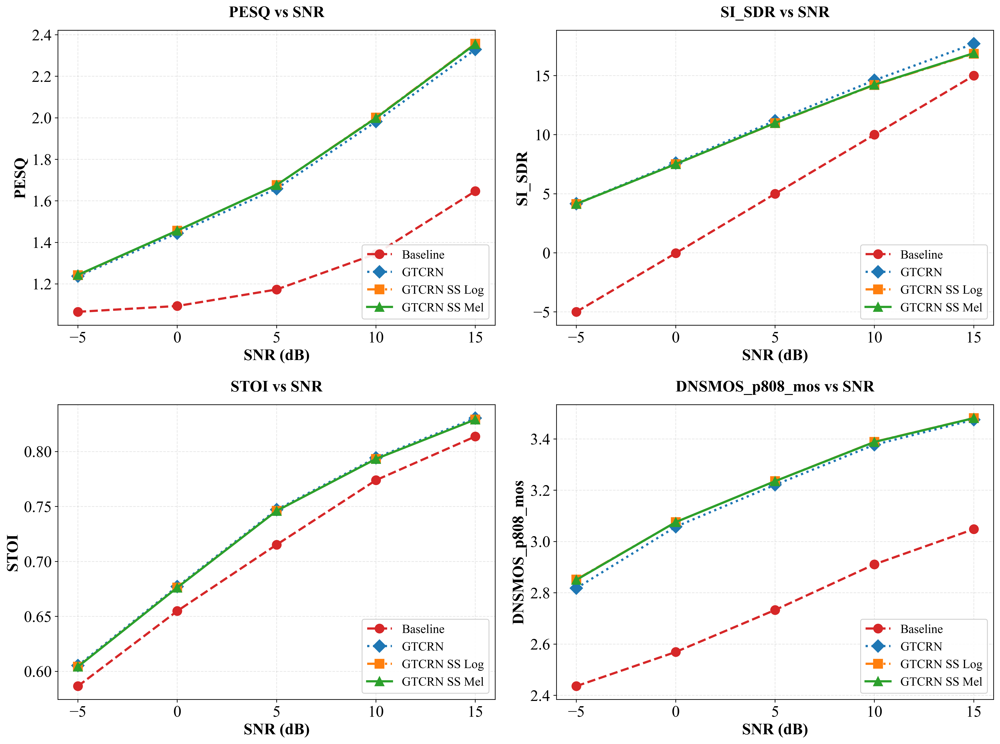

✓ Comparison plots saved!


In [7]:



# Load data for all SNR levels
snr_levels = [-5, 0, 5, 10, 15]
metrics = ['PESQ', 'SI_SDR', 'STOI', 'DNSMOS_p808_mos']

# Create comparison dataframes
comparison_data = {metric: {snr: {} for snr in snr_levels} for metric in metrics}

for snr in snr_levels:
    baseline = parse_baseline_csv(snr)
    gtcrn_ss_log = parse_gtcrn_ss_log_csv(snr)
    gtcrn_ss_mel = parse_gtcrn_ss_mel_csv(snr)
    gtcrn = parse_gtcrn(snr)
    
    for metric in metrics:
        comparison_data[metric][snr]['Baseline'] = baseline[metric].mean()
        comparison_data[metric][snr]['GTCRN'] = gtcrn[metric].mean()
        comparison_data[metric][snr]['GTCRN SS Log'] = gtcrn_ss_log[metric].mean()
        comparison_data[metric][snr]['GTCRN SS Mel'] = gtcrn_ss_mel[metric].mean()

# Convert to DataFrames for easier plotting
comparison_dfs = {}
for metric in metrics:
    df = pd.DataFrame(comparison_data[metric]).T
    df.index.name = 'SNR (dB)'
    comparison_dfs[metric] = df

print("✓ Data loaded successfully!")
print("\nPESQ Comparison Preview:")
print(comparison_dfs['PESQ'].round(4))


## Performance Comparison Plots
print("\nGenerating performance comparison plots...")

# Create comprehensive comparison plots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

colors = ["#d62728", '#1f77b4', '#ff7f0e', '#2ca02c']
markers = ['o', 'D', 's', '^']
linestyles = ['--', ':', '-.', '-']

for idx, metric in enumerate(metrics):
    ax = axes[idx]
    df = comparison_dfs[metric]
    
    # C
    for i, col in enumerate(df.columns):
        ax.plot(df.index, df[col], 
                marker=markers[i], 
                color=colors[i],
                linestyle=linestyles[i],
                linewidth=2.5, 
                markersize=10,
                label=col)
    
    ax.set_xlabel('SNR (dB)', fontweight='bold')
    ax.set_ylabel(metric, fontweight='bold')
    ax.set_title(f'{metric} vs SNR', fontweight='bold', pad=15)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(loc='lower right', framealpha=0.9, fontsize=14)
    ax.set_xticks(snr_levels)

plt.tight_layout()
plt.savefig(output_dir / 'GTCRN_SS_comparison_all_metrics.png', 
            dpi=400, bbox_inches='tight')
plt.savefig(output_dir / 'GTCRN_SS_comparison_all_metrics.svg',
            format='svg', bbox_inches='tight')
plt.show()

print("✓ Comparison plots saved!")


In [8]:




## Improvement Analysis (vs GTCRN)
print("\nCalculating improvements over GTCRN...")

# Calculate improvements
improvement_over_gtcrn_log = {}
improvement_over_gtcrn_mel = {}
improvement_mel_over_log = {}

for metric in metrics:
    df = comparison_dfs[metric]
    improvement_over_gtcrn_log[metric] = ((df['GTCRN SS Log'] - df['GTCRN']) / df['GTCRN'] * 100).round(2)
    improvement_over_gtcrn_mel[metric] = ((df['GTCRN SS Mel'] - df['GTCRN']) / df['GTCRN'] * 100).round(2)
    improvement_mel_over_log[metric] = ((df['GTCRN SS Mel'] - df['GTCRN SS Log']) / df['GTCRN SS Log'] * 100).round(2)

# Create summary table
improvement_summary = pd.DataFrame({
    'SNR (dB)': snr_levels,
})

for metric in metrics:
    improvement_summary[f'{metric} Log vs GTCRN (%)'] = improvement_over_gtcrn_log[metric].values
    improvement_summary[f'{metric} Mel vs GTCRN (%)'] = improvement_over_gtcrn_mel[metric].values
    improvement_summary[f'{metric} Mel vs Log (%)'] = improvement_mel_over_log[metric].values

improvement_summary = improvement_summary.set_index('SNR (dB)')

print("\nImprovement Summary (% over GTCRN):")
print("="*100)
print(improvement_summary.round(2))

# Export improvement summary
improvement_summary.to_csv(output_dir / 'improvement_summary_vs_GTCRN.csv')
print("\n✓ Improvement summary exported")




Calculating improvements over GTCRN...

Improvement Summary (% over GTCRN):
          PESQ Log vs GTCRN (%)  PESQ Mel vs GTCRN (%)  PESQ Mel vs Log (%)  \
SNR (dB)                                                                      
-5                         0.42                   0.51                 0.08   
 0                         0.84                   0.85                 0.02   
 5                         1.06                   1.07                 0.01   
 10                        0.97                   0.88                -0.09   
 15                        1.18                   1.11                -0.07   

          SI_SDR Log vs GTCRN (%)  SI_SDR Mel vs GTCRN (%)  \
SNR (dB)                                                     
-5                          -0.46                    -0.32   
 0                          -1.33                    -1.25   
 5                          -1.79                    -1.66   
 10                         -2.73                    -2.56 


Analyzing performance by noise type...

Generating PESQ per-noise type plots...


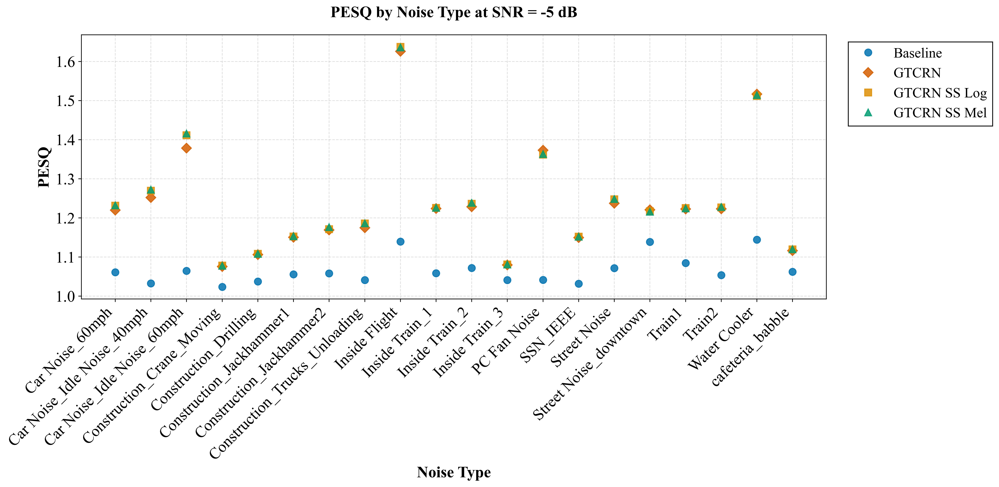

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_PESQ_comparison.png and GTCRN_SS_per_noise_SNR-5dB_PESQ_comparison.svg


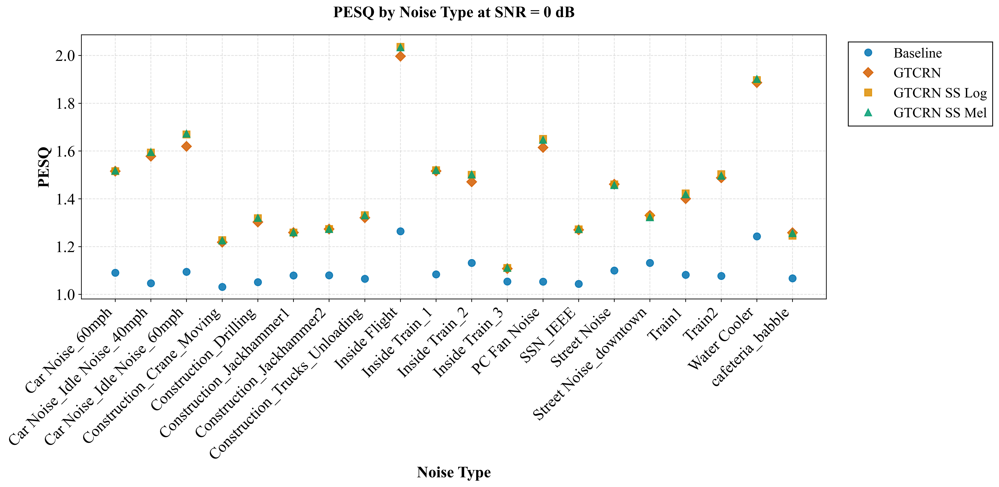

✓ Saved: GTCRN_SS_per_noise_SNR0dB_PESQ_comparison.png and GTCRN_SS_per_noise_SNR0dB_PESQ_comparison.svg


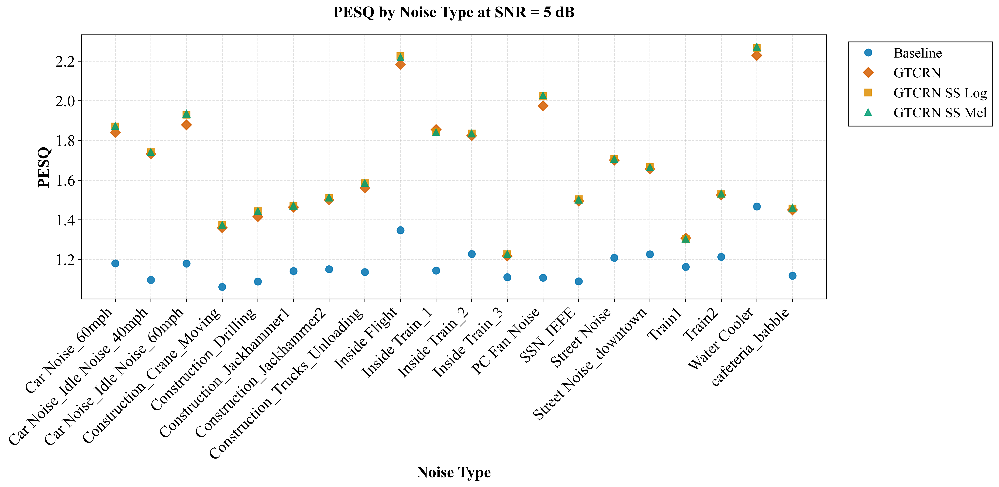

✓ Saved: GTCRN_SS_per_noise_SNR5dB_PESQ_comparison.png and GTCRN_SS_per_noise_SNR5dB_PESQ_comparison.svg

Exporting PESQ data to CSV...
✓ Exported: GTCRN_SS_per_noise_SNR-5dB_PESQ_data.csv
✓ Exported: GTCRN_SS_per_noise_SNR0dB_PESQ_data.csv
✓ Exported: GTCRN_SS_per_noise_SNR5dB_PESQ_data.csv


In [9]:



## Per-Noise Type Analysis
print("\nAnalyzing performance by noise type...")

snr_subset = [-5, 0, 5]

# Collect data for all systems across the SNR subset
noise_data_pesq = {}
noise_data_sisdr = {}

for snr in snr_subset:
    baseline_by_noise = parse_baseline_csv(snr)
    gtcrn_ss_log_by_noise = parse_gtcrn_ss_log_csv(snr)
    gtcrn_ss_mel_by_noise = parse_gtcrn_ss_mel_csv(snr)
    gtcrn_by_noise = parse_gtcrn(snr)
    
    for noise_type in baseline_by_noise.index:
        # PESQ data
        if noise_type not in noise_data_pesq:
            noise_data_pesq[noise_type] = {
                'Baseline': {},
                'GTCRN': {},
                'GTCRN SS Log': {},
                'GTCRN SS Mel': {}
            }
        
        noise_data_pesq[noise_type]['Baseline'][snr] = baseline_by_noise.loc[noise_type, 'PESQ']
        noise_data_pesq[noise_type]['GTCRN'][snr] = gtcrn_by_noise.loc[noise_type, 'PESQ']
        noise_data_pesq[noise_type]['GTCRN SS Log'][snr] = gtcrn_ss_log_by_noise.loc[noise_type, 'PESQ']
        noise_data_pesq[noise_type]['GTCRN SS Mel'][snr] = gtcrn_ss_mel_by_noise.loc[noise_type, 'PESQ']
        
        # SI-SDR data
        if noise_type not in noise_data_sisdr:
            noise_data_sisdr[noise_type] = {
                'Baseline': {},
                'GTCRN': {},
                'GTCRN SS Log': {},
                'GTCRN SS Mel': {}
            }
        
        noise_data_sisdr[noise_type]['Baseline'][snr] = baseline_by_noise.loc[noise_type, 'SI_SDR']
        noise_data_sisdr[noise_type]['GTCRN'][snr] = gtcrn_by_noise.loc[noise_type, 'SI_SDR']
        noise_data_sisdr[noise_type]['GTCRN SS Log'][snr] = gtcrn_ss_log_by_noise.loc[noise_type, 'SI_SDR']
        noise_data_sisdr[noise_type]['GTCRN SS Mel'][snr] = gtcrn_ss_mel_by_noise.loc[noise_type, 'SI_SDR']

# Prepare data for plotting
noise_types = sorted(noise_data_pesq.keys())
x_pos = np.arange(len(noise_types))

# Define colors and styles (colorblind-friendly palette)
system_styles = {
    'Baseline': {'color': "#0173B2", 'marker': 'o', 'linestyle': '--', 'linewidth': 2.5},
    'GTCRN': {'color': '#D55E00', 'marker': 'D', 'linestyle': ':', 'linewidth': 2.5},
    'GTCRN SS Log': {'color': "#DE8F05", 'marker': 's', 'linestyle': '-.', 'linewidth': 2.5},
    'GTCRN SS Mel': {'color': '#029E73', 'marker': '^', 'linestyle': '-', 'linewidth': 3}
}

## PESQ Per-Noise Type Plots
print("\nGenerating PESQ per-noise type plots...")

for snr in snr_subset:
    fig, ax = plt.subplots(figsize=(16, 8))
    
    for system_name, style in system_styles.items():
        pesq_values = [noise_data_pesq[noise_type][system_name][snr] for noise_type in noise_types]
        
        ax.plot(x_pos, pesq_values,
                label=system_name,
                color=style['color'],
                marker=style['marker'],
                linestyle='None',
                linewidth=style['linewidth'],
                markersize=8,
                alpha=0.85)
    
    ax.set_xlabel('Noise Type', fontweight='bold')
    ax.set_ylabel('PESQ', fontweight='bold')
    ax.set_title(f'PESQ by Noise Type at SNR = {snr} dB', 
                 fontweight='bold', pad=20)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(noise_types, rotation=45, ha='right')
    ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), framealpha=0.95, fontsize=16, 
              edgecolor='black', fancybox=False)
    ax.grid(True, alpha=0.4, linestyle='--', linewidth=0.8, axis='both', which='major')
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    
    filename_png = f'GTCRN_SS_per_noise_SNR{snr}dB_PESQ_comparison.png'
    filename_svg = f'GTCRN_SS_per_noise_SNR{snr}dB_PESQ_comparison.svg'
    plt.savefig(output_dir / filename_png, dpi=400, bbox_inches='tight')
    plt.savefig(output_dir / filename_svg, format='svg', bbox_inches='tight')
    plt.show()
    
    print(f"✓ Saved: {filename_png} and {filename_svg}")

# Export PESQ data to CSV
print("\nExporting PESQ data to CSV...")
for snr in snr_subset:
    csv_data = {'Noise_Type': noise_types}
    
    for system_name in system_styles.keys():
        pesq_values = [noise_data_pesq[noise_type][system_name][snr] for noise_type in noise_types]
        csv_data[system_name.replace(' ', '_')] = pesq_values
    
    csv_df = pd.DataFrame(csv_data)
    csv_filename = f'GTCRN_SS_per_noise_SNR{snr}dB_PESQ_data.csv'
    csv_df.to_csv(output_dir / csv_filename, index=False, float_format='%.6f')
    print(f"✓ Exported: {csv_filename}")





Generating SI-SDR per-noise type plots...


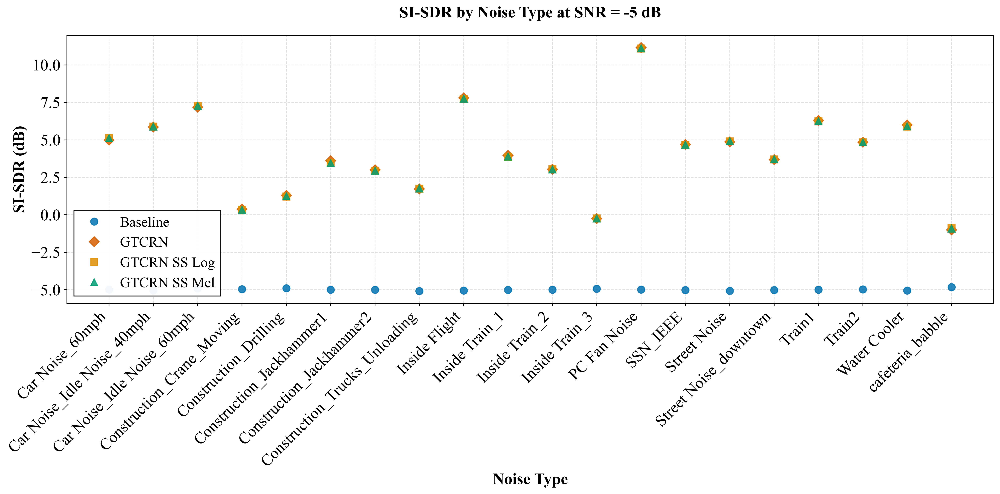

✓ Saved: GTCRN_SS_per_noise_SNR-5dB_SISDR_comparison.png and GTCRN_SS_per_noise_SNR-5dB_SISDR_comparison.svg


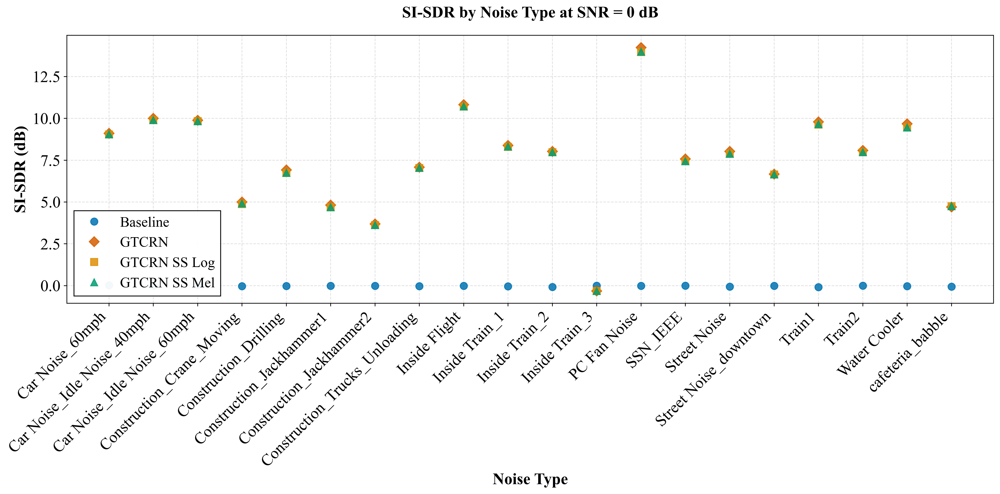

✓ Saved: GTCRN_SS_per_noise_SNR0dB_SISDR_comparison.png and GTCRN_SS_per_noise_SNR0dB_SISDR_comparison.svg


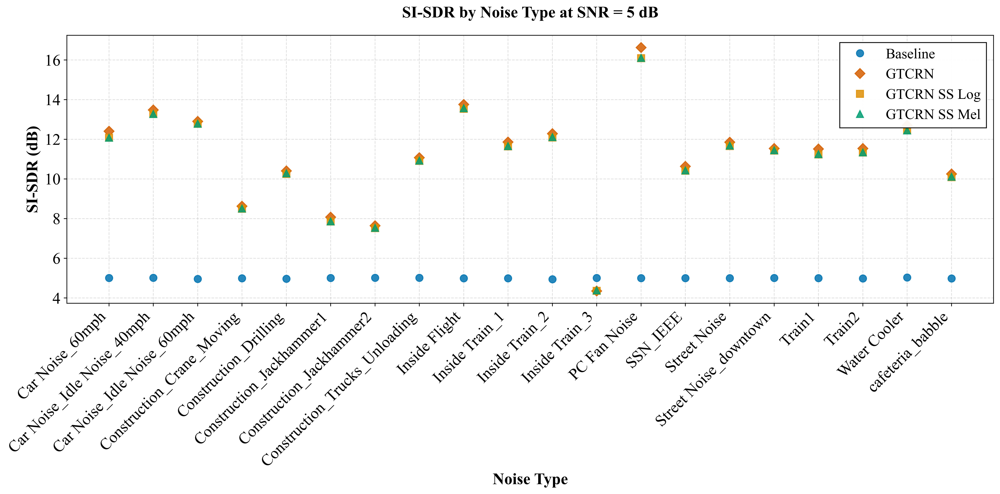

✓ Saved: GTCRN_SS_per_noise_SNR5dB_SISDR_comparison.png and GTCRN_SS_per_noise_SNR5dB_SISDR_comparison.svg

Exporting SI-SDR data to CSV...
✓ Exported: GTCRN_SS_per_noise_SNR-5dB_SISDR_data.csv
✓ Exported: GTCRN_SS_per_noise_SNR0dB_SISDR_data.csv
✓ Exported: GTCRN_SS_per_noise_SNR5dB_SISDR_data.csv


In [10]:

## SI-SDR Per-Noise Type Plots
print("\nGenerating SI-SDR per-noise type plots...")

for snr in snr_subset:
    fig, ax = plt.subplots(figsize=(16, 8))
    
    for system_name, style in system_styles.items():
        sisdr_values = [noise_data_sisdr[noise_type][system_name][snr] for noise_type in noise_types]
        
        ax.plot(x_pos, sisdr_values,
                label=system_name,
                color=style['color'],
                marker=style['marker'],
                linestyle='None',
                linewidth=style['linewidth'],
                markersize=8,
                alpha=0.85)
    
    ax.set_xlabel('Noise Type', fontweight='bold')
    ax.set_ylabel('SI-SDR (dB)', fontweight='bold')
    ax.set_title(f'SI-SDR by Noise Type at SNR = {snr} dB', 
                 fontweight='bold', pad=20)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(noise_types, rotation=45, ha='right')
    ax.legend(loc='best', framealpha=0.95, fontsize=16, 
              edgecolor='black', fancybox=False)
    ax.grid(True, alpha=0.4, linestyle='--', linewidth=0.8, axis='both', which='major')
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    
    filename_png = f'GTCRN_SS_per_noise_SNR{snr}dB_SISDR_comparison.png'
    filename_svg = f'GTCRN_SS_per_noise_SNR{snr}dB_SISDR_comparison.svg'
    plt.savefig(output_dir / filename_png, dpi=400, bbox_inches='tight')
    plt.savefig(output_dir / filename_svg, format='svg', bbox_inches='tight')
    plt.show()
    
    print(f"✓ Saved: {filename_png} and {filename_svg}")

# Export SI-SDR data to CSV
print("\nExporting SI-SDR data to CSV...")
for snr in snr_subset:
    csv_data = {'Noise_Type': noise_types}
    
    for system_name in system_styles.keys():
        sisdr_values = [noise_data_sisdr[noise_type][system_name][snr] for noise_type in noise_types]
        csv_data[system_name.replace(' ', '_')] = sisdr_values
    
    csv_df = pd.DataFrame(csv_data)
    csv_filename = f'GTCRN_SS_per_noise_SNR{snr}dB_SISDR_data.csv'
    csv_df.to_csv(output_dir / csv_filename, index=False, float_format='%.6f')
    print(f"✓ Exported: {csv_filename}")




NOISE TYPE BENEFIT ANALYSIS

SNR = -5 dB - Noise Types Ranked by Improvement over GTCRN

GTCRN SS Log Configuration:
----------------------------------------------------------------------------------------------------

  PESQ:
    1. Car Noise_Idle Noise_60mph:   +2.38%
    2. Car Noise_Idle Noise_40mph:   +1.39%
    3. Car Noise_60mph     :   +0.93%
    4. Construction_Trucks_Unloading:   +0.91%
    5. Street Noise        :   +0.80%
    6. Inside Flight       :   +0.71%
    7. Inside Train_2      :   +0.65%
    8. Train2              :   +0.30%
    9. cafeteria_babble    :   +0.30%
    10. SSN_IEEE            :   +0.22%
    11. Construction_Crane_Moving:   +0.22%
    12. Train1              :   +0.19%
    13. Construction_Drilling:   +0.18%
    14. Construction_Jackhammer1:   +0.18%
    15. Construction_Jackhammer2:   +0.16%
    16. Inside Train_1      :   +0.16%
    17. Inside Train_3      :   +0.09%
    18. Street Noise_downtown:   -0.31%
    19. Water Cooler        :   -0.33%
    

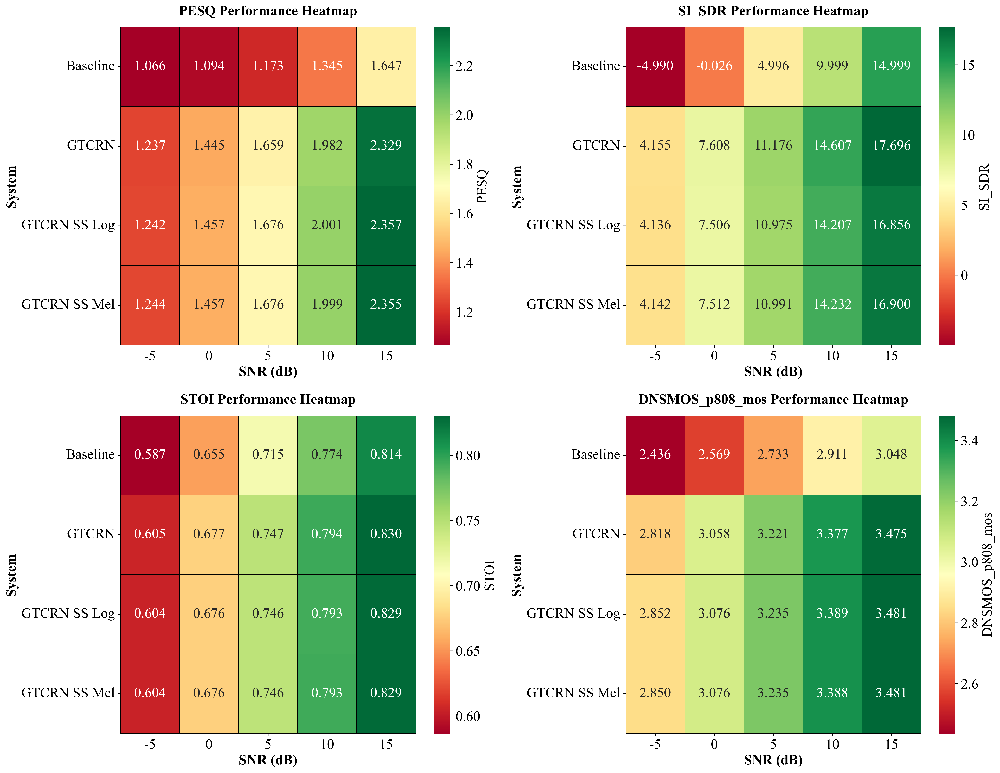

✓ Heatmap visualization saved!

EXPORTING ALL ANALYSIS RESULTS
✓ Exported: comparison_PESQ.csv
✓ Exported: comparison_SI_SDR.csv
✓ Exported: comparison_STOI.csv
✓ Exported: comparison_DNSMOS_p808_mos.csv

✓ All results exported to: c:\Users\gabi\Documents\University\Uni2025\Investigation\PROJECT-25P85\DATA_ANALYSIS\SS\GTCRN_SS_hybrid\GTCRN_SS_comparison


In [11]:


## Noise Type Benefit Analysis
print("\n" + "="*100)
print("NOISE TYPE BENEFIT ANALYSIS")
print("="*100)

# Calculate improvements for each noise type over GTCRN
for snr in snr_subset:
    print(f"\n{'='*100}")
    print(f"SNR = {snr} dB - Noise Types Ranked by Improvement over GTCRN")
    print(f"{'='*100}")
    
    gtcrn_by_noise = parse_gtcrn(snr)
    gtcrn_ss_log_by_noise = parse_gtcrn_ss_log_csv(snr)
    gtcrn_ss_mel_by_noise = parse_gtcrn_ss_mel_csv(snr)
    
    # Calculate improvements for each configuration
    for config, config_data in [('GTCRN SS Log', gtcrn_ss_log_by_noise), 
                                 ('GTCRN SS Mel', gtcrn_ss_mel_by_noise)]:
        print(f"\n{config} Configuration:")
        print("-" * 100)
        
        for metric in metrics:
            improvement_by_noise = {}
            for noise_type in gtcrn_by_noise.index:
                gtcrn_val = gtcrn_by_noise.loc[noise_type, metric]
                config_val = config_data.loc[noise_type, metric]
                improvement = ((config_val - gtcrn_val) / gtcrn_val * 100)
                improvement_by_noise[noise_type] = improvement
            
            # Sort by improvement (descending)
            sorted_noise = sorted(improvement_by_noise.items(), key=lambda x: x[1], reverse=True)
            
            print(f"\n  {metric}:")
            for rank, (noise, imp) in enumerate(sorted_noise, 1):
                print(f"    {rank}. {noise:20s}: {imp:+7.2f}%")


## Statistical Summary
print("\n" + "="*100)
print("EXPERIMENT GTCRN_SS: STATISTICAL SUMMARY")
print("="*100)

# Overall performance across all SNRs
print("\nOVERALL PERFORMANCE SUMMARY (Average across all SNR levels):")
print("-"*100)
overall_summary = pd.DataFrame({
    'Metric': metrics,
})

for col in ['Baseline', 'GTCRN', 'GTCRN SS Log', 'GTCRN SS Mel']:
    overall_summary[col] = [comparison_dfs[m][col].mean() for m in metrics]

overall_summary = overall_summary.set_index('Metric')
print(overall_summary.round(4))

# Export overall summary
overall_summary.to_csv(output_dir / 'overall_summary.csv')
print("\n✓ Overall summary exported")

# Calculate average improvements
print("\nAVERAGE IMPROVEMENT OVER GTCRN (%):")
print("-"*100)
avg_improvement_gtcrn = pd.DataFrame({
    'Metric': metrics,
    'GTCRN SS Log vs GTCRN': [(comparison_dfs[m]['GTCRN SS Log'].mean() - comparison_dfs[m]['GTCRN'].mean()) / comparison_dfs[m]['GTCRN'].mean() * 100 for m in metrics],
    'GTCRN SS Mel vs GTCRN': [(comparison_dfs[m]['GTCRN SS Mel'].mean() - comparison_dfs[m]['GTCRN'].mean()) / comparison_dfs[m]['GTCRN'].mean() * 100 for m in metrics],
}).set_index('Metric')
print(avg_improvement_gtcrn.round(2))

print("\nAVERAGE IMPROVEMENT OF MEL OVER LOG (%):")
print("-"*100)
avg_improvement_mel = pd.DataFrame({
    'Metric': metrics,
    'Improvement': [(comparison_dfs[m]['GTCRN SS Mel'].mean() - comparison_dfs[m]['GTCRN SS Log'].mean()) / comparison_dfs[m]['GTCRN SS Log'].mean() * 100 for m in metrics],
}).set_index('Metric')
print(avg_improvement_mel.round(2))


## Heatmap Visualization
print("\nGenerating performance heatmaps...")

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
axes = axes.flatten()

for idx, metric in enumerate(metrics):
    ax = axes[idx]
    df = comparison_dfs[metric]
    
    sns.heatmap(df.T, annot=True, fmt='.3f', cmap='RdYlGn', 
                ax=ax, cbar_kws={'label': metric},
                linewidths=0.5, linecolor='black')
    
    ax.set_title(f'{metric} Performance Heatmap', fontweight='bold', pad=15)
    ax.set_xlabel('SNR (dB)', fontweight='bold')
    ax.set_ylabel('System', fontweight='bold')

plt.tight_layout()
plt.savefig(output_dir / 'GTCRN_SS_performance_heatmaps.png', 
            dpi=400, bbox_inches='tight')
plt.savefig(output_dir / 'GTCRN_SS_performance_heatmaps.svg',
            format='svg', bbox_inches='tight')
plt.show()

print("✓ Heatmap visualization saved!")


## Export All Comparison Data
print("\n" + "="*100)
print("EXPORTING ALL ANALYSIS RESULTS")
print("="*100)

# Export comparison data for all metrics
for metric in metrics:
    filepath = output_dir / f"comparison_{metric}.csv"
    comparison_dfs[metric].to_csv(filepath)
    print(f"✓ Exported: {filepath.name}")

print(f"\n✓ All results exported to: {output_dir}")
print("="*100)



In [13]:


## Final Summary
print("\n" + "="*100)
print("GTCRN SPECTRAL SUBTRACTION: FINAL SUMMARY")
print("="*100)

print("\nEXPERIMENT OVERVIEW:")
print("-"*100)
print("• Method: GTCRN-based Spectral Subtraction")
print("• Configurations: Log-scale vs Mel-scale")
print("• Frame Duration: 20ms with 75% overlap")
print("• Filter Length: 8, N=4 iterations")
print("• SNR Levels: -5, 0, 5, 10, 15 dB")
print("• Metrics: PESQ, STOI, SI-SDR, DNSMOS")

print("\nKEY FINDINGS:")
print("-"*100)

# Determine which method is better overall
mel_better_count = sum(1 for m in metrics if 
    comparison_dfs[m]['GTCRN SS Mel'].mean() > comparison_dfs[m]['GTCRN SS Log'].mean())

if mel_better_count > len(metrics) / 2:
    print(f"✓ Mel-scale outperforms Log-scale on {mel_better_count}/{len(metrics)} metrics")
else:
    print(f"✓ Log-scale outperforms Mel-scale on {len(metrics) - mel_better_count}/{len(metrics)} metrics")

# Best performing configuration vs GTCRN
for metric in metrics:
    log_avg = comparison_dfs[metric]['GTCRN SS Log'].mean()
    mel_avg = comparison_dfs[metric]['GTCRN SS Mel'].mean()
    gtcrn_avg = comparison_dfs[metric]['GTCRN'].mean()
    
    log_vs_gtcrn = ((log_avg - gtcrn_avg) / gtcrn_avg * 100)
    mel_vs_gtcrn = ((mel_avg - gtcrn_avg) / gtcrn_avg * 100)
    
    better = 'Mel' if mel_avg > log_avg else 'Log'
    improvement = abs((mel_avg - log_avg) / log_avg * 100)
    print(f"  {metric}: {better}-scale better by {improvement:.2f}% (Log vs GTCRN: {log_vs_gtcrn:+.2f}%, Mel vs GTCRN: {mel_vs_gtcrn:+.2f}%)")

print("\n" + "="*100)
print("ANALYSIS COMPLETE!")
print("="*100)


GTCRN SPECTRAL SUBTRACTION: FINAL SUMMARY

EXPERIMENT OVERVIEW:
----------------------------------------------------------------------------------------------------
• Method: GTCRN-based Spectral Subtraction
• Configurations: Log-scale vs Mel-scale
• Frame Duration: 20ms with 75% overlap
• Filter Length: 8, N=4 iterations
• SNR Levels: -5, 0, 5, 10, 15 dB
• Metrics: PESQ, STOI, SI-SDR, DNSMOS

KEY FINDINGS:
----------------------------------------------------------------------------------------------------
✓ Log-scale outperforms Mel-scale on 3/4 metrics
  PESQ: Log-scale better by 0.02% (Log vs GTCRN: +0.94%, Mel vs GTCRN: +0.92%)
  SI_SDR: Mel-scale better by 0.18% (Log vs GTCRN: -2.83%, Mel vs GTCRN: -2.65%)
  STOI: Log-scale better by 0.00% (Log vs GTCRN: -0.15%, Mel vs GTCRN: -0.15%)
  DNSMOS_p808_mos: Log-scale better by 0.01% (Log vs GTCRN: +0.53%, Mel vs GTCRN: +0.51%)

ANALYSIS COMPLETE!
